In [7]:
# Loading libraries
%matplotlib inline
import os
import os.path
from netCDF4 import Dataset
import matplotlib as mpl
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import rc
import fnmatch
from cycler import cycler
import pandas as pd
from pandas import read_csv, to_datetime, DataFrame
import datetime
import time
import matplotlib.dates as mdates
import scipy as scp
import scipy.stats as scpst

from matplotlib.path import Path
from matplotlib.patches import PathPatch
from mpl_toolkits.basemap import Basemap # Basemap pour les cartes

In [2]:
# LOADING GRID FILE AND VARIABLES
!pwd
grid_file = '../DATA/grille.nc' 
print 'file exist:', os.path.isfile(grid_file)

f = Dataset(grid_file) # open netcdf
# extracting variables
lon_t = f.variables['longitude_t'][:] # extracting lon data
lat_t = f.variables['latitude_t'][:] # extracting lat data
depth_t = f.variables['depth_t'][:]
bathy = f.variables['h_w'][:]
print 'Bathy :', np.shape(bathy), 'max :', np.max(bathy), 'min :', np.min(bathy)

f.close()

new_bath = np.ma.masked_where(bathy<200, bathy)
region_list = ['NWE', 'SWE', 'ION', 'LEV'] #

/home/dosa/MON_ENV_PYTHON/ARTICLE_IAV
file exist: True
Bathy : (160, 394) max : 5054.49 min : 20.5226


In [20]:
## Création des arrays en lisant moyenne annuelles
file_path = "./LAST_OUTPUT_FEV2019_GRAZ/"

var_list = ['nit_int150', 'mld_dens', 'chl_int150']
year_list = np.arange(1970,2012)
c = 0

for var in var_list:
    vars()[var+'_arr'] = np.zeros([len(year_list), 160, 394])
    vars()[var+'_arr'][:] = np.nan

for year in year_list:
    print year
    f = Dataset(file_path+str(year)+'.nc')
    
    for var in var_list:
        vars()[var+'_arr'][c,:,:] = f.variables[var][0,:,:] # extracting data
                
    c += 1

1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011


In [21]:
np.shape(nit_int150_arr)

(42, 160, 394)

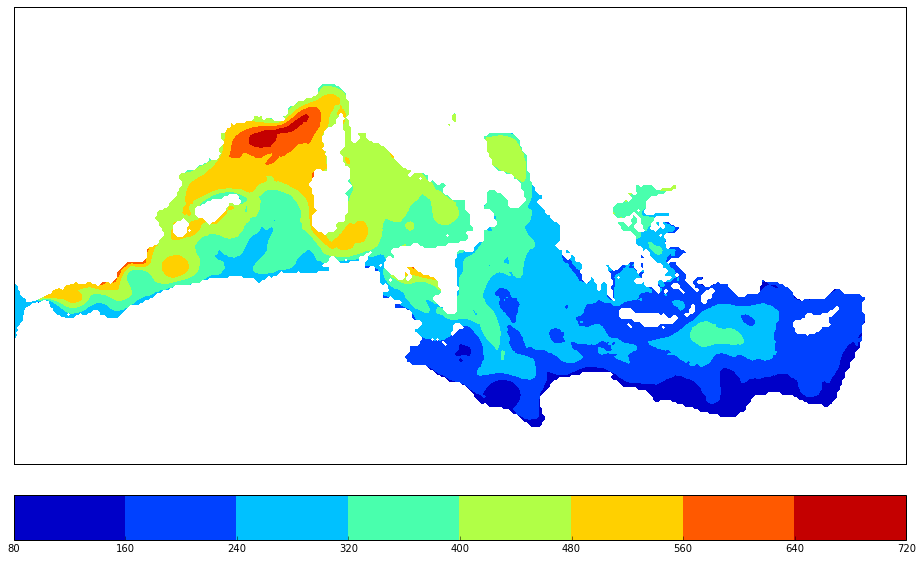

In [36]:
plt.figure(figsize=(16,16));

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);

data_to_plot = nit_int150_arr[9,:,:]
# doing a map # Données
xd,yd = m(lon_t,lat_t);
cs = m.contourf(xd,yd,data_to_plot,cmap=plt.cm.jet);#levels=levels, cmap=plt.cm.RdYlBu_r
plt.colorbar(cs, orientation='horizontal', pad = 0.035)

In [28]:
test = np.arange(0,9)
testt = np.arange(2,11)
scpst.pearsonr(test, testt)[0]

1.0

In [32]:
test = np.arange(0,9)
testt = np.arange(9,18)
scpst.spearmanr(test, testt)

SpearmanrResult(correlation=1.0, pvalue=0.0)

In [33]:
## Listes pour corrélations
corr_list1 = ['nit_int150', 'chl_int150']
corr_list2 = ['mld_dens']

## Corrélation Pearson
for corr1 in corr_list1:
    for corr2 in corr_list2:
        print corr1, corr2
        vars()['Pearson_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Pearson_'+corr1+'_'+corr2][:] = np.nan
        
        vars()['Spearman_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Spearman_'+corr1+'_'+corr2][:] = np.nan
        
        for i in np.arange(0,160):
            for j in np.arange(0,394):
                vect1 = vars()[corr1+'_arr'][:,i,j]
                vect2 = vars()[corr2+'_arr'][:,i,j]
                vars()['Pearson_'+corr1+'_'+corr2][i,j] = scpst.pearsonr(vect1,vect2)[0]
                vars()['Spearman_'+corr1+'_'+corr2][i,j] = scpst.spearmanr(vect1,vect2)[0]
                vect1 = []
                vect2 = []
                
print 'END of CELL'

nit_int150 mld_dens
chl_int150 mld_dens
END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/numpy/lib/function_base.py:2569: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/numpy/lib/function_base.py:2570: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/_distn_infrastructure.py:1754: RuntimeWarning: invalid value encountered in greater
  cond1 = (scale > 0) & (x > self.a) & (x < self.b)
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/_distn_infrastructure.py:1754: RuntimeWarning: invalid value encountered in less
  cond1 = (scale > 0) & (x > self.a) & (x < self.b)
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/_distn_infrastructure.py:1755: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in less_equal
  app.launch_new_instance()
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in greater


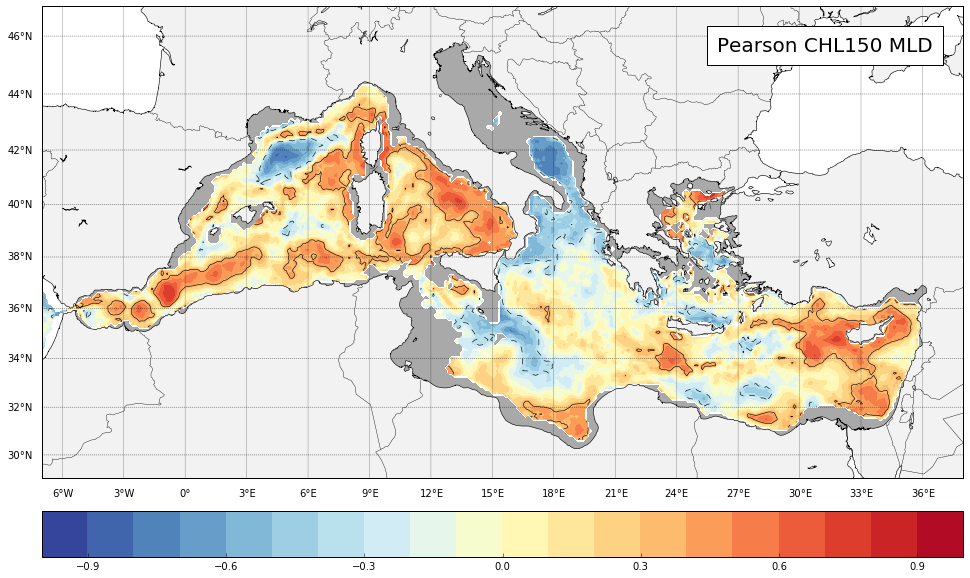

In [60]:
# test #
test = bathy
test[test<=200] = 0
test[test>200] = np.nan
test[lon_t<-5.5] = np.nan
test[(lat_t>40) & (lon_t>26.9)] = np.nan

fig = plt.figure(figsize=(16,16));

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,2);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,3); # 1.5
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

data_to_plot = Pearson_chl_int150_mld_dens
# doing a map # Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1.1,0.1);
levels2 = [-0.3440,0.3440]; # More precise critical value for df=31 (N=33)
levels_bathy = [200] ;
m.contourf(xd,yd,test,cmap=plt.cm.Greys);
CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
plt.colorbar(cs, orientation='horizontal', pad = 0.035)

x_text,y_text = m(36.5,46)
this_txt = 'Pearson CHL150 MLD'
plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') #

plt.savefig('/home/dosa/THESE/CR_reunions/MAR2019_FIGS/CORR_VERIF_COMPAR/Pearson_CHLINT150_MLD.png',bbox_inches='tight',format='png')

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in less_equal
  app.launch_new_instance()
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in greater
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:22: RuntimeWarning: invalid value encountered in less


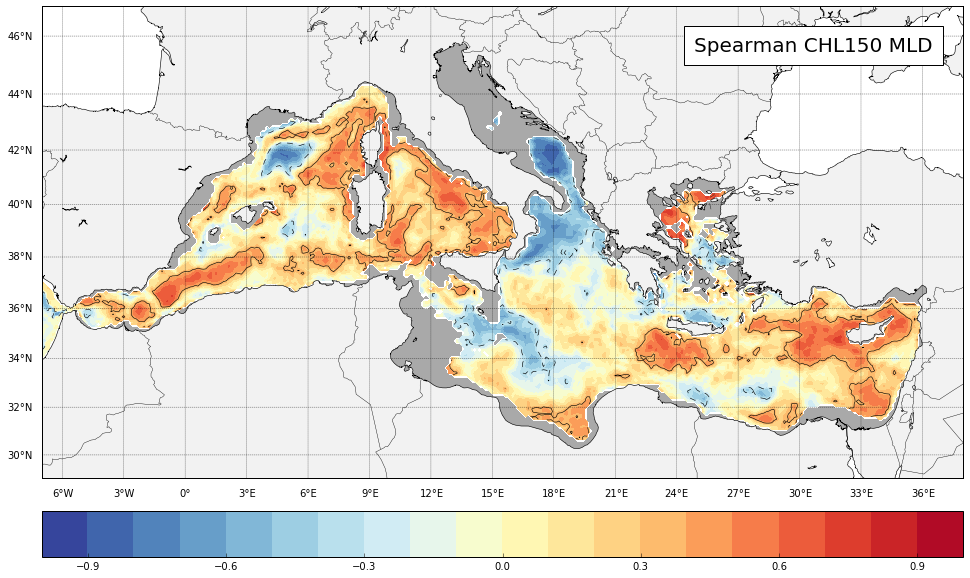

In [61]:
# test #
test = bathy
test[test<=200] = 0
test[test>200] = np.nan
test[lon_t<-5.5] = np.nan
test[(lat_t>40) & (lon_t>26.9)] = np.nan

fig = plt.figure(figsize=(16,16));

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,2);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,3); # 1.5
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

data_to_plot = Spearman_chl_int150_mld_dens
data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)

# doing a map # Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1.1,0.1);
levels2 = [-0.3440,0.3440]; # More precise critical value for df=31 (N=33)
levels_bathy = [200] ;
m.contourf(xd,yd,test,cmap=plt.cm.Greys);
CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
plt.colorbar(cs, orientation='horizontal', pad = 0.035)

x_text,y_text = m(36.5,46)
this_txt = 'Spearman CHL150 MLD'
plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') # 'fa

plt.savefig('/home/dosa/THESE/CR_reunions/MAR2019_FIGS/CORR_VERIF_COMPAR/Spearman_CHLINT150_MLD.png',bbox_inches='tight',format='png')

In [50]:
## Listes pour corrélations
corr_list1 = ['mld_dens']
corr_list2 = ['mld_dens']

## Corrélation Pearson
for corr1 in corr_list1:
    for corr2 in corr_list2:
        print corr1, corr2
        vars()['Pearson_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Pearson_'+corr1+'_'+corr2][:] = np.nan
        
        vars()['Spearman_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Spearman_'+corr1+'_'+corr2][:] = np.nan
        
        for i in np.arange(0,160):
            for j in np.arange(0,394):
                vect1 = vars()[corr1+'_arr'][:,i,j]
                vect2 = vars()[corr2+'_arr'][:,i,j]
                vars()['Pearson_'+corr1+'_'+corr2][i,j] = scpst.pearsonr(vect1,vect2)[0]
                vars()['Spearman_'+corr1+'_'+corr2][i,j] = scpst.spearmanr(vect1,vect2)[0]
                vect1 = []
                vect2 = []
                
print 'END of CELL'

mld_dens mld_dens
END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/stats.py:2542: RuntimeWarning: invalid value encountered in double_scalars
  r = r_num / r_den


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less


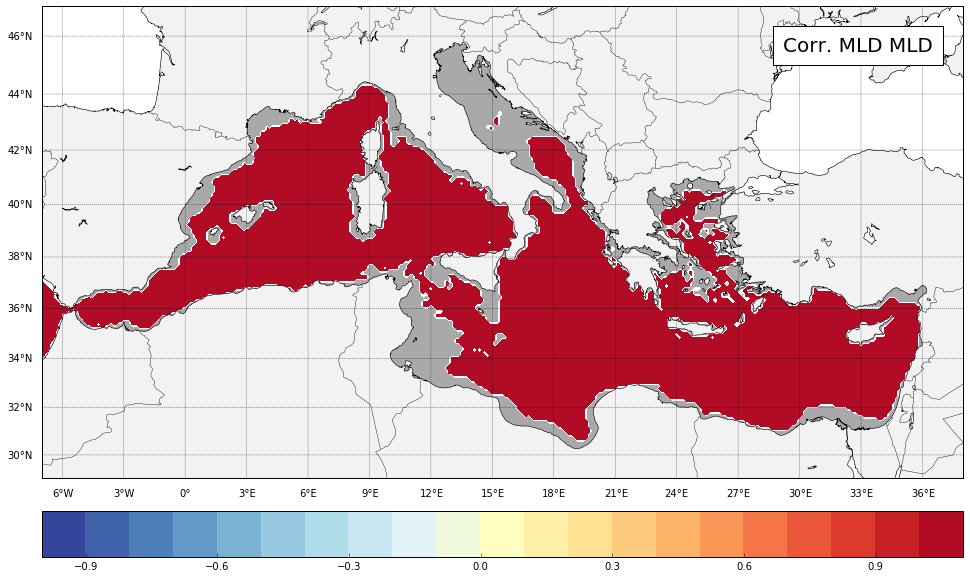

In [53]:
fig = plt.figure(figsize=(16,16));

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,2);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,3); # 1.5
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

data_to_plot = Pearson_mld_dens_mld_dens
data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)

# doing a map # Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1.2,0.1);
levels2 = [-0.3440,0.3440]; # More precise critical value for df=31 (N=33)
levels_bathy = [200] ;
m.contourf(xd,yd,test,cmap=plt.cm.Greys);
CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
plt.colorbar(cs, orientation='horizontal', pad = 0.035)

x_text,y_text = m(36.5,46)
this_txt = 'Corr. MLD MLD'
plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') # 'fa

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less


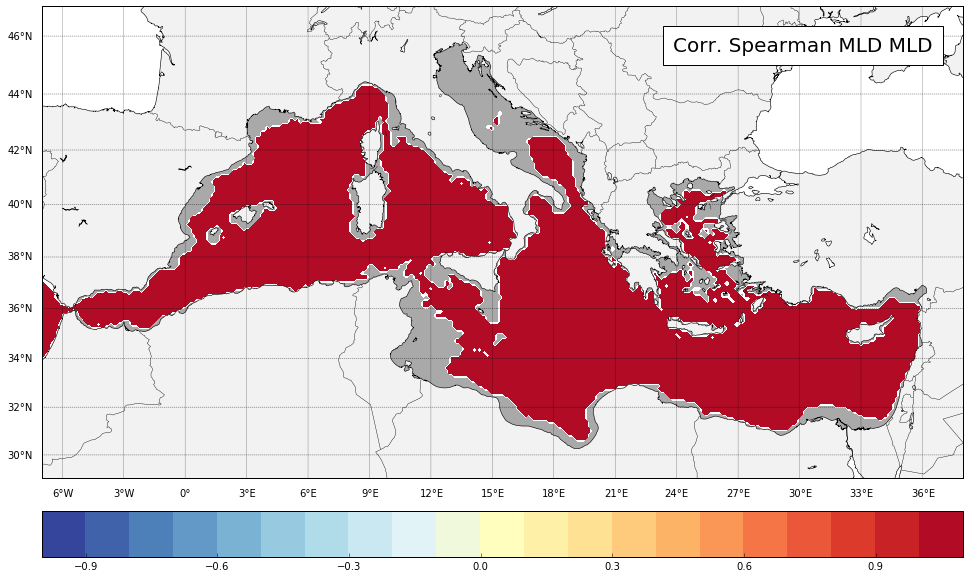

In [56]:
fig = plt.figure(figsize=(16,16));

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,2);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,3); # 1.5
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

data_to_plot = Spearman_mld_dens_mld_dens
data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)

# doing a map # Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1.2,0.1);
levels2 = [-0.3440,0.3440]; # More precise critical value for df=31 (N=33)
levels_bathy = [200] ;
m.contourf(xd,yd,test,cmap=plt.cm.Greys);
CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
plt.colorbar(cs, orientation='horizontal', pad = 0.035)

x_text,y_text = m(36.5,46)
this_txt = 'Corr. Spearman MLD MLD'
plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') # 'fa

In [51]:
## Listes pour corrélations
corr_list1 = ['nit_int150']
corr_list2 = ['nit_int150']

## Corrélation Pearson
for corr1 in corr_list1:
    for corr2 in corr_list2:
        print corr1, corr2
        vars()['Pearson_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Pearson_'+corr1+'_'+corr2][:] = np.nan
        
        vars()['Spearman_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Spearman_'+corr1+'_'+corr2][:] = np.nan
        
        for i in np.arange(0,160):
            for j in np.arange(0,394):
                vect1 = vars()[corr1+'_arr'][:,i,j]
                vect2 = vars()[corr2+'_arr'][:,i,j]
                vars()['Pearson_'+corr1+'_'+corr2][i,j] = scpst.pearsonr(vect1,vect2)[0]
                vars()['Spearman_'+corr1+'_'+corr2][i,j] = scpst.spearmanr(vect1,vect2)[0]
                vect1 = []
                vect2 = []
                
print 'END of CELL'

nit_int150 nit_int150
END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less


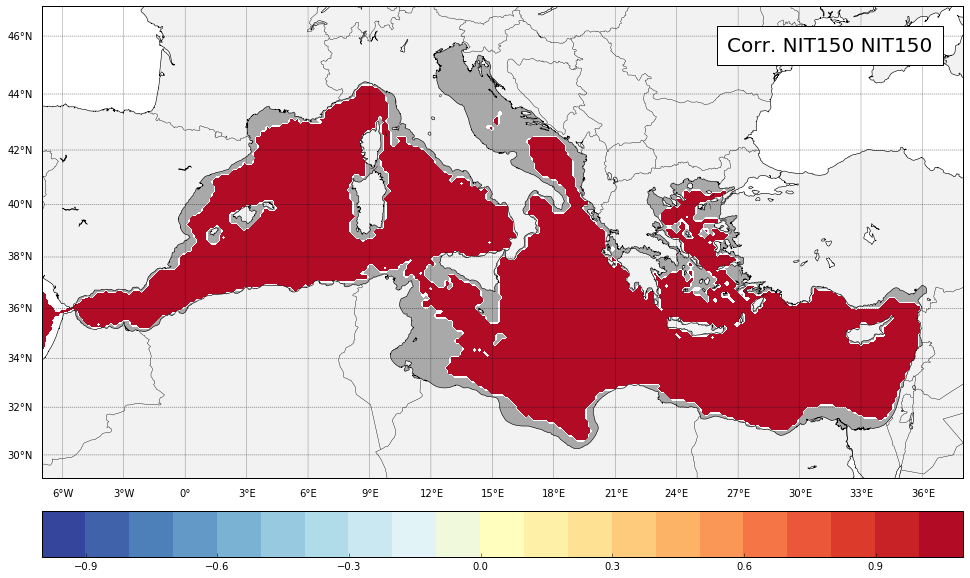

In [57]:
fig = plt.figure(figsize=(16,16));

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,2);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,3); # 1.5
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

data_to_plot = Pearson_nit_int150_nit_int150
data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)

# doing a map # Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1.2,0.1);
levels2 = [-0.3440,0.3440]; # More precise critical value for df=31 (N=33)
levels_bathy = [200] ;
m.contourf(xd,yd,test,cmap=plt.cm.Greys);
CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
plt.colorbar(cs, orientation='horizontal', pad = 0.035)

x_text,y_text = m(36.5,46)
this_txt = 'Corr. NIT150 NIT150'
plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') # 'fa

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:15: RuntimeWarning: invalid value encountered in less


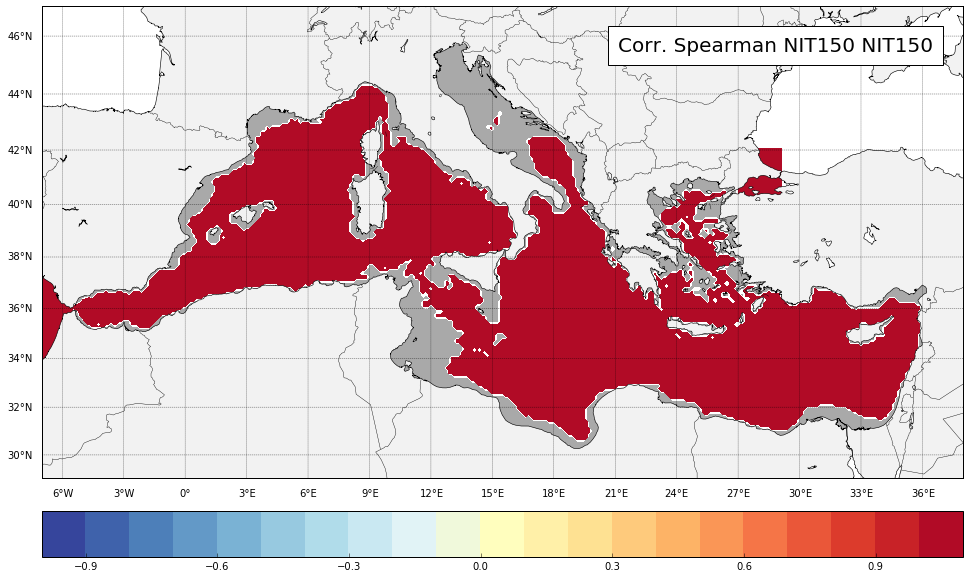

In [58]:
fig = plt.figure(figsize=(16,16));

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,2);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,3); # 1.5
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

data_to_plot = Spearman_nit_int150_nit_int150
data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)

# doing a map # Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1.2,0.1);
levels2 = [-0.3440,0.3440]; # More precise critical value for df=31 (N=33)
levels_bathy = [200] ;
m.contourf(xd,yd,test,cmap=plt.cm.Greys);
CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
plt.colorbar(cs, orientation='horizontal', pad = 0.035)

x_text,y_text = m(36.5,46)
this_txt = 'Corr. Spearman NIT150 NIT150'
plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') # 'fa

In [ ]:
###########

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in less_equal
  app.launch_new_instance()
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in greater


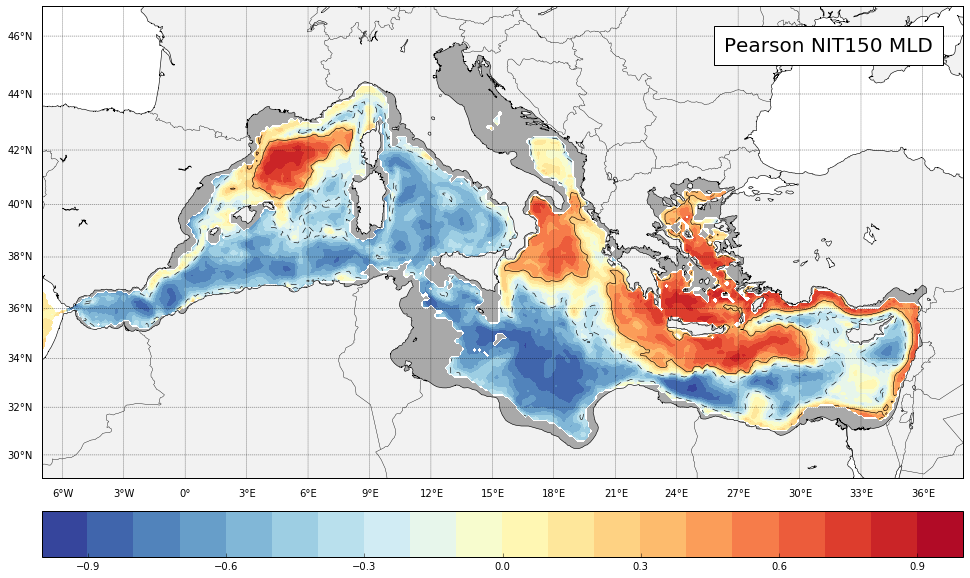

In [67]:
# test #
test = bathy
test[test<=200] = 0
test[test>200] = np.nan
test[lon_t<-5.5] = np.nan
test[(lat_t>40) & (lon_t>26.9)] = np.nan

fig = plt.figure(figsize=(16,16));

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,2);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,3); # 1.5
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

data_to_plot = Pearson_nit_int150_mld_dens
# doing a map # Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1.1,0.1);
levels2 = [-0.304,0.304]; # More precise critical value for df=31 (N=33)
levels_bathy = [200] ;
m.contourf(xd,yd,test,cmap=plt.cm.Greys);
CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
plt.colorbar(cs, orientation='horizontal', pad = 0.035)

x_text,y_text = m(36.5,46)
this_txt = 'Pearson NIT150 MLD'
plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') #

plt.savefig('/home/dosa/THESE/CR_reunions/MAR2019_FIGS/CORR_VERIF_COMPAR/Pearson_NIT150_MLD_df40.png',bbox_inches='tight',format='png')

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:3: RuntimeWarning: invalid value encountered in less_equal
  app.launch_new_instance()
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:4: RuntimeWarning: invalid value encountered in greater
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:22: RuntimeWarning: invalid value encountered in less


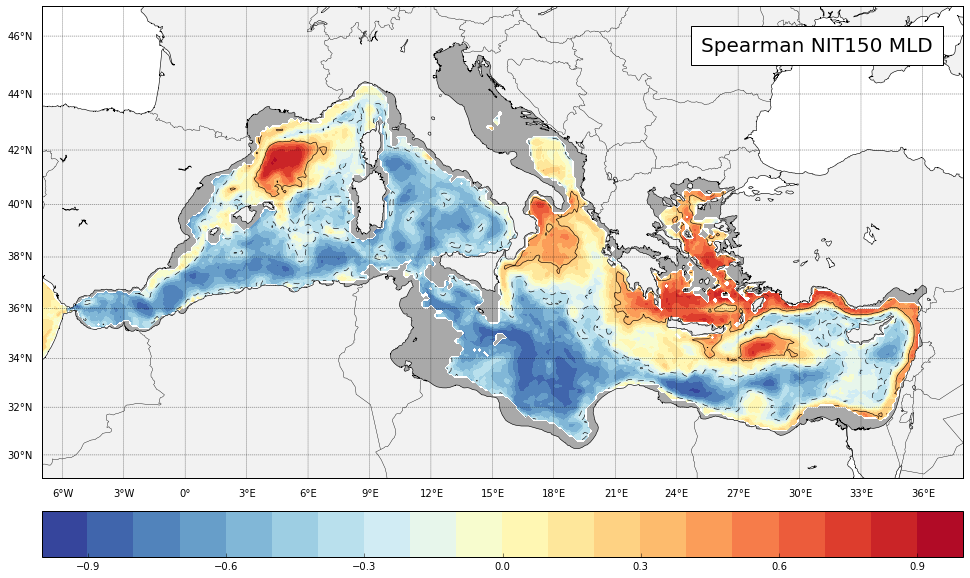

In [66]:
# test #
test = bathy
test[test<=200] = 0
test[test>200] = np.nan
test[lon_t<-5.5] = np.nan
test[(lat_t>40) & (lon_t>26.9)] = np.nan

fig = plt.figure(figsize=(16,16));

x1,x2,y1,y2 = -7, 38, 29, 47;
m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
ax = fig.add_axes([0.1,0.1,0.8,0.8]);
m.drawcountries(linewidth=0.4);
m.drawcoastlines(linewidth=0.6);
m.fillcontinents(color='0.95',lake_color='white');
parallels = np.arange(0.,81,2);
m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
meridians = np.arange(-6.,351.,3); # 1.5
m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

data_to_plot = Spearman_nit_int150_mld_dens
data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)

# doing a map # Données
xd,yd = m(lon_t,lat_t);
levels = np.arange(-1,1.1,0.1);
levels2 = [-0.304,0.304]; # More precise critical value for df=31 (N=33)
levels_bathy = [200] ;
m.contourf(xd,yd,test,cmap=plt.cm.Greys);
CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
plt.colorbar(cs, orientation='horizontal', pad = 0.035)

x_text,y_text = m(36.5,46)
this_txt = 'Spearman NIT150 MLD'
plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') #

plt.savefig('/home/dosa/THESE/CR_reunions/MAR2019_FIGS/CORR_VERIF_COMPAR/Spearman_NIT150_MLD_df40.png',bbox_inches='tight',format='png')

In [65]:
###########

32

In [10]:
# test #
test = bathy
test[test<=200] = 0
test[test>200] = np.nan
test[lon_t<-5.5] = np.nan
test[(lat_t>40) & (lon_t>26.9)] = np.nan

In [4]:
# New loops with more variables
## Création des arrays en lisant moyenne annuelles
file_path = "./LAST_OUTPUT_FEV2019_GRAZ/"

#var_list = ['nit_int150', 'mld_dens', 'chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
#           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150'] # phyto zoo 3D => laisse de côté
var_list = ['graz', 'graz_herbi', 'graz_pur']

year_list = np.arange(1970,2012)
c = 0

for var in var_list:
    vars()[var+'_arr'] = np.zeros([len(year_list), 160, 394])
    vars()[var+'_arr'][:] = np.nan

for year in year_list:
    print year
    f = Dataset(file_path+str(year)+'.nc')
    
    for var in var_list:
        if var == 'chlsurf':
            vars()[var+'_arr'][c,:,:] = f.variables['chl_tot'][0,42,:,:] # extracting data
        else:
            vars()[var+'_arr'][c,:,:] = f.variables[var][0,:,:] # extracting data
                
    c += 1

1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2000
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011


In [8]:
## Listes pour corrélations
corr_list1 = ['nit_int150', 'mld_dens', 'chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150', 'graz', 'graz_herbi', 'graz_pur']
corr_list2 = ['mld_dens', 'nit_int150']

## Corrélation Pearson
for corr1 in corr_list1:
    for corr2 in corr_list2:
        print corr1, corr2
        vars()['Pearson_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Pearson_'+corr1+'_'+corr2][:] = np.nan
        
        vars()['Spearman_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Spearman_'+corr1+'_'+corr2][:] = np.nan
        
        for i in np.arange(0,160):
            for j in np.arange(0,394):
                vect1 = vars()[corr1+'_arr'][:,i,j]
                vect2 = vars()[corr2+'_arr'][:,i,j]
                vars()['Pearson_'+corr1+'_'+corr2][i,j] = scpst.pearsonr(vect1,vect2)[0]
                vars()['Spearman_'+corr1+'_'+corr2][i,j] = scpst.spearmanr(vect1,vect2)[0]
                vect1 = []
                vect2 = []
                
print 'END of CELL'

nit_int150 mld_dens
nit_int150 nit_int150
mld_dens

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/numpy/lib/function_base.py:2569: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/numpy/lib/function_base.py:2570: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/_distn_infrastructure.py:1754: RuntimeWarning: invalid value encountered in greater
  cond1 = (scale > 0) & (x > self.a) & (x < self.b)
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/_distn_infrastructure.py:1754: RuntimeWarning: invalid value encountered in less
  cond1 = (scale > 0) & (x > self.a) & (x < self.b)
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/_distn_infrastructure.py:1755: RuntimeWarning: invalid value encountered in less_equal
  cond2 = cond0 & (x <= self.a)
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/scipy/stats/stats.py:2542:

 mld_dens
mld_dens nit_int150
chl_int150 mld_dens
chl_int150 nit_int150
UptNitsurf mld_dens
UptNitsurf nit_int150
UptNitint mld_dens
UptNitint nit_int150
UptAmmoSurf mld_dens
UptAmmoSurf nit_int150
UptAmmoint mld_dens
UptAmmoint nit_int150
chlsurf mld_dens
chlsurf nit_int150
export_poc200 mld_dens
export_poc200 nit_int150
export_doc200 mld_dens
export_doc200 nit_int150
ppb mld_dens
ppb nit_int150
netppb mld_dens
netppb nit_int150
chl_int150 mld_dens
chl_int150 nit_int150
graz mld_dens
graz nit_int150
graz_herbi mld_dens
graz_herbi nit_int150
graz_pur mld_dens
graz_pur nit_int150
END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in less


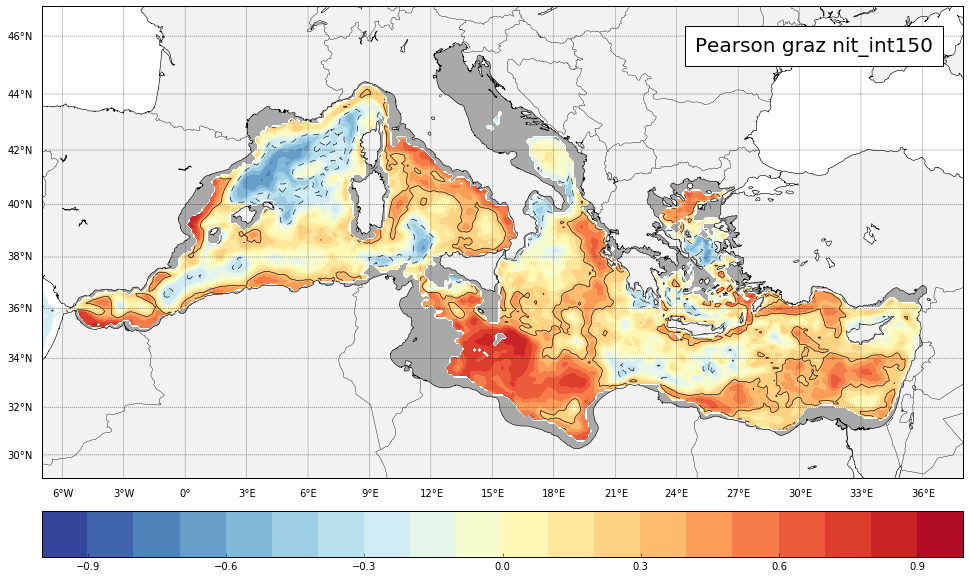

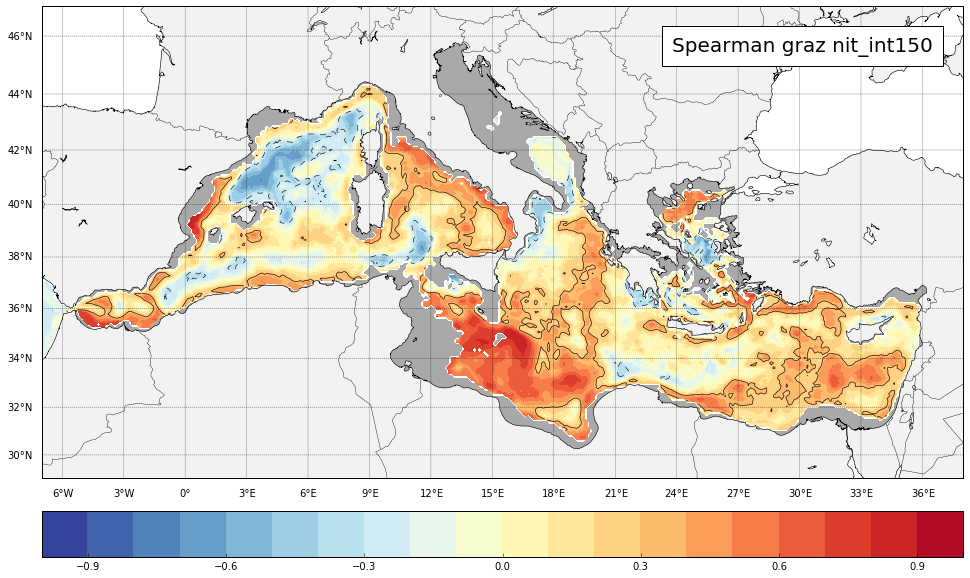

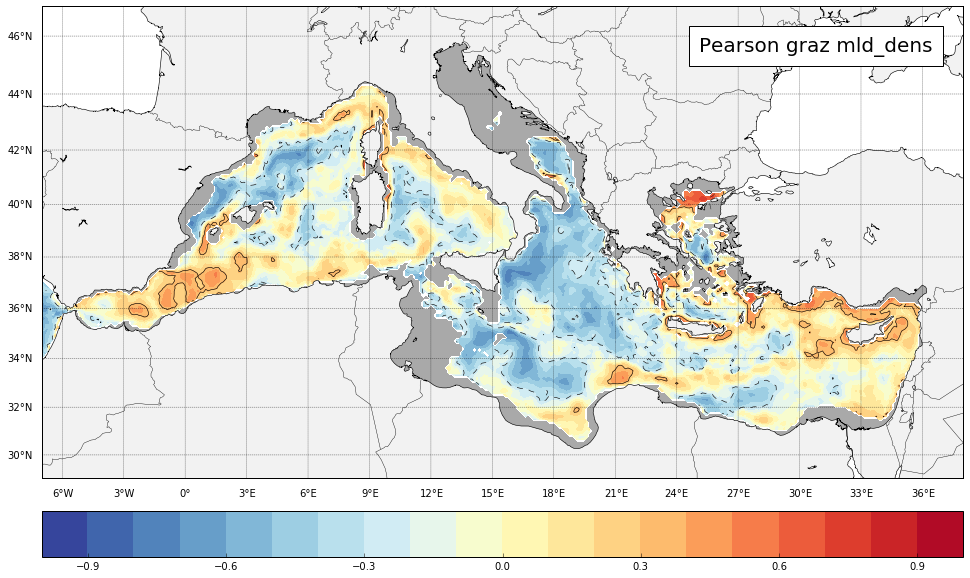

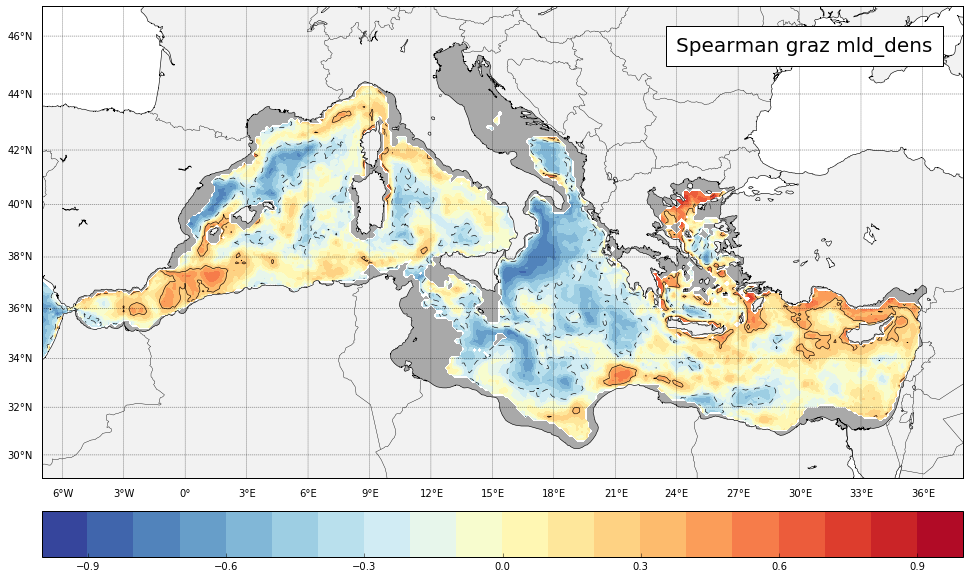

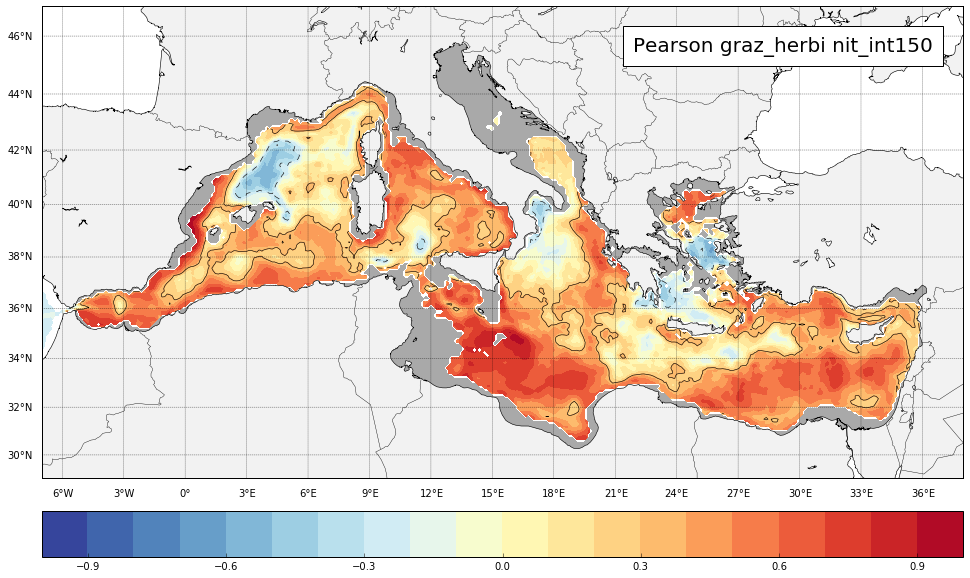

...

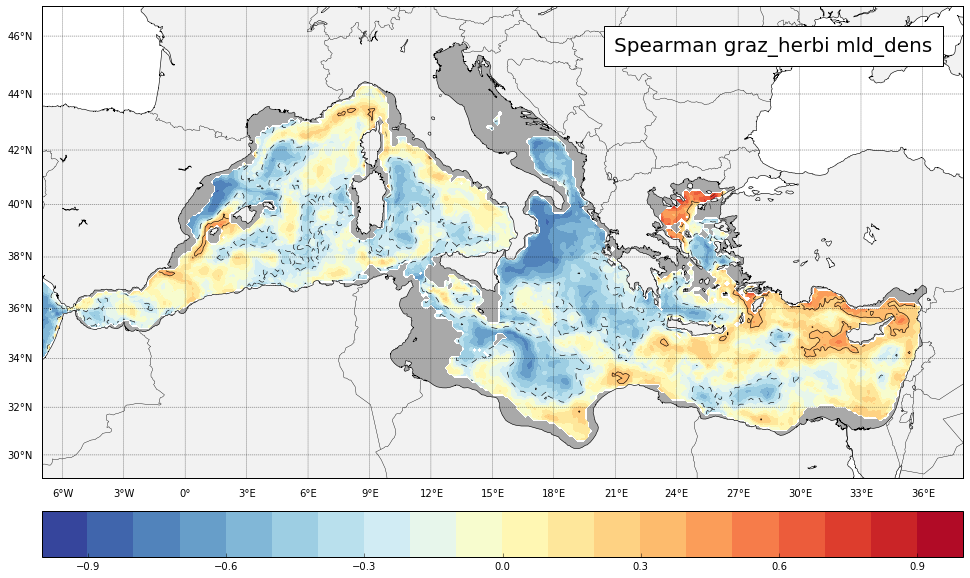

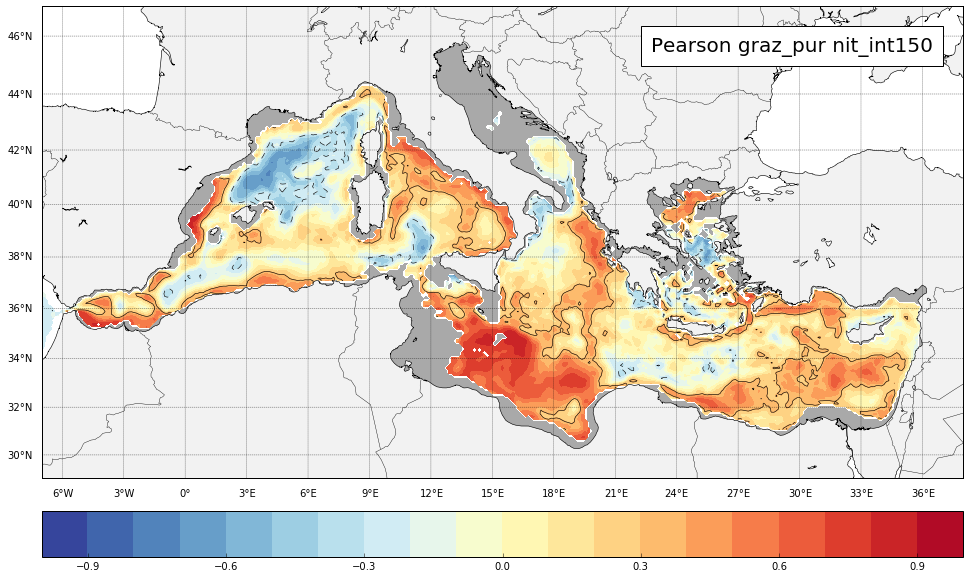

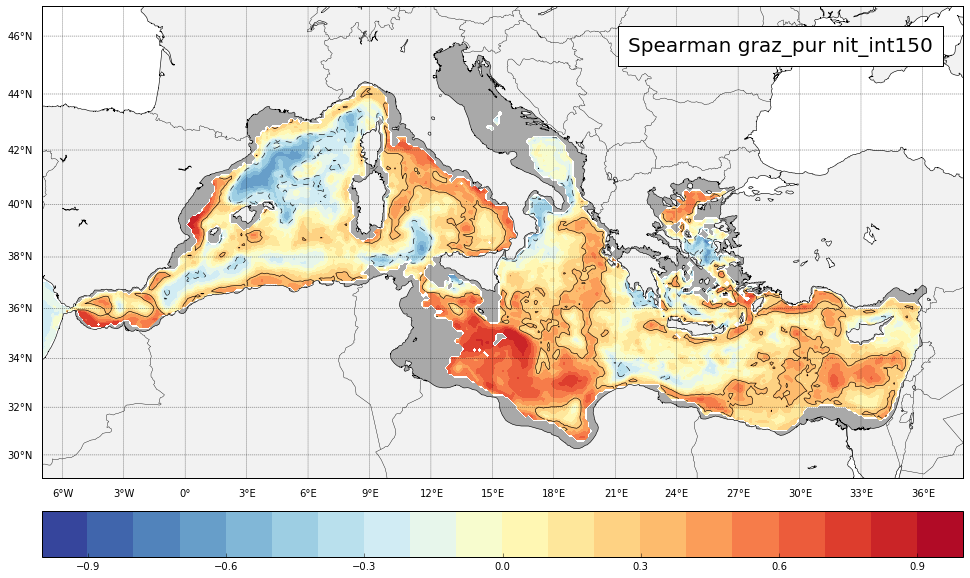

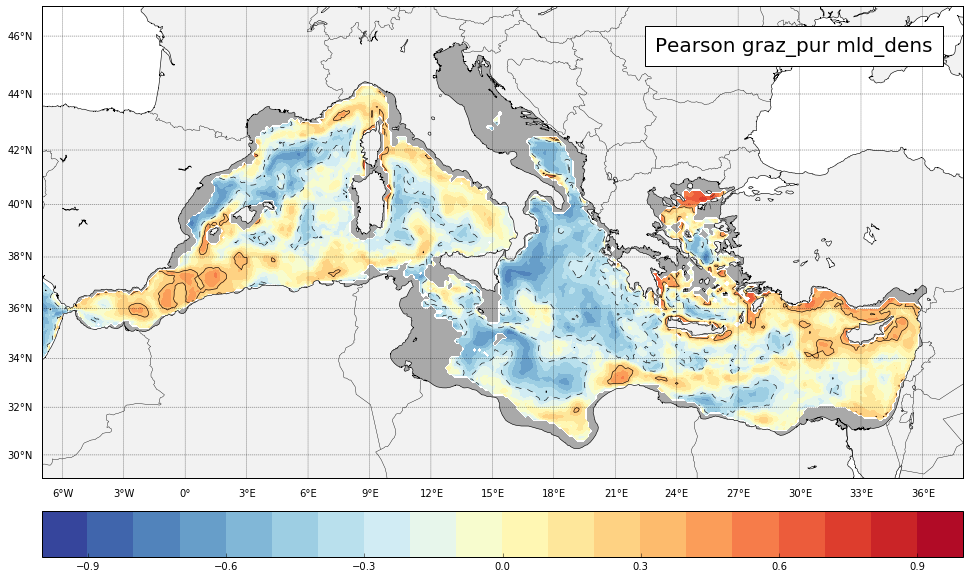

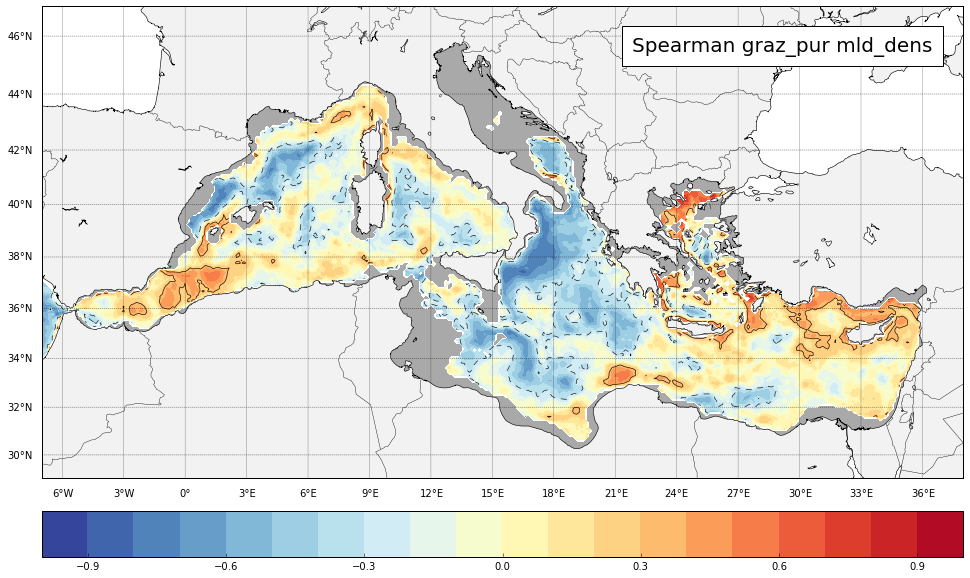

In [11]:
## Listes pour corrélations
#corr_list1 = ['chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
#           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150']
corr_list1 = ['graz', 'graz_herbi', 'graz_pur']
#corr_list2 = ['mld_dens']
corr_list2 = ['nit_int150', 'mld_dens']
method_list = ['Pearson', 'Spearman']


## Pour figs
for corr1 in corr_list1:
    for corr2 in corr_list2:
        for method in method_list:
            fig = plt.figure(figsize=(16,16));

            x1,x2,y1,y2 = -7, 38, 29, 47;
            m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            ax = fig.add_axes([0.1,0.1,0.8,0.8]);
            m.drawcountries(linewidth=0.4);
            m.drawcoastlines(linewidth=0.6);
            m.fillcontinents(color='0.95',lake_color='white');
            parallels = np.arange(0.,81,2);
            m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
            meridians = np.arange(-6.,351.,3); # 1.5
            m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

            data_to_plot = vars()[method+'_'+corr1+'_'+corr2]
            data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)
            
            # doing a map # Données
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(-1,1.1,0.1);
            levels2 = [-0.304,0.304]; # More precise critical value for df=31 (N=33)
            levels_bathy = [200] ;
            m.contourf(xd,yd,test,cmap=plt.cm.Greys);
            CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
            CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
            plt.colorbar(cs, orientation='horizontal', pad = 0.035)

            x_text,y_text = m(36.5,46)
            this_txt = method+' '+corr1+' '+corr2
            plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') #

            plt.savefig('/home/dosa/THESE/CR_reunions/MAR2019_FIGS/NEW_CORR_PYTHON/'+method+'_'+corr1+'_'+corr2+'.png',bbox_inches='tight',format='png')

In [12]:
# 26/02 ouverture en boucle de tous les fichiers
file_list = ['Debit'] # 

for file in file_list:
    vars()['df_'+file] = pd.read_table('./debitnew/debit_section_Gibraltar'+file,sep='\s+',names=['time','debit','debpos','debneg','debsw',
                                       'debssw','debiw','debdw'])
    vars()['df_'+file]['date'] = pd.to_datetime(vars()['df_'+file]['time'], format="%Y%m%d")
    vars()['df_'+file]['yy'] = pd.DatetimeIndex(vars()['df_'+file]['date']).year
    vars()['df_'+file]['mm'] = pd.DatetimeIndex(vars()['df_'+file]['date']).month
    
    yy_corr = np.zeros([len(vars()['df_'+file])])
    yy_corr[:] = np.nan
    vars()['df_'+file]['yy_corr'] = yy_corr
    
    for o in np.arange(0, len(vars()['df_'+file])):
        if vars()['df_'+file]['mm'][o] >= 10:
            vars()['df_'+file]['yy_corr'][o] = vars()['df_'+file]['yy'][o]
        else:
            vars()['df_'+file]['yy_corr'][o] = vars()['df_'+file]['yy'][o]-1

print 'End of cell'

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


End of cell


In [13]:
np.shape(df_Debit)

(3140, 12)

In [15]:
df_Debit.head()

,time,debit,debpos,debneg,debsw,debssw,debiw,debdw,date,yy,mm,yy_corr
0,19700620,-0.020637,0.943565,-0.964202,-0.936437,0.248761,0.667038,0.0,1970-06-20,1970,6,1969.0
1,19700625,-0.015008,0.801230,-0.816238,-0.779864,0.219843,0.545013,0.0,1970-06-25,1970,6,1969.0
2,19700630,-0.047478,0.788233,-0.835711,-0.832975,0.222176,0.563321,0.0,1970-06-30,1970,6,1969.0
3,19700705,-0.055067,0.787660,-0.842727,-0.837223,0.201540,0.580616,0.0,1970-07-05,1970,7,1969.0
4,19700710,-0.019751,0.846375,-0.866126,-0.838558,0.211183,0.607623,0.0,1970-07-10,1970,7,1969.0


In [17]:
year_list = np.arange(1970,2012)
file_list = ['Debit'] #

for file in file_list:
    print file
    count = 0
    vars()['AnnMean_'+file] = np.zeros([len(year_list)]) # ou len year_list pareil

    for y in year_list:
        vars()['AnnMean_'+file][count] =  vars()['df_'+file].groupby('yy_corr')['debsw'].mean()[y]
        count += 1
np.shape(AnnMean_Debit)

Debit


(42,)

In [19]:
# TEST ENTREE GIB
## Listes pour corrélations
#corr_list1 = ['nit_int150', 'mld_dens', 'chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
#           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150', 'graz', 'graz_herbi', 'graz_pur']
corr_list1 = ['nit_int150', 'mld_dens']
corr_list2 = ['Debit']

## Corrélation Pearson
for corr1 in corr_list1:
    for corr2 in corr_list2:
        print corr1, corr2
        
        vars()['Spearman_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Spearman_'+corr1+'_'+corr2][:] = np.nan
        
        for i in np.arange(0,160):
            for j in np.arange(0,394):
                vect1 = vars()[corr1+'_arr'][:,i,j]
                vect2 = vars()['AnnMean_'+corr2]
                vars()['Spearman_'+corr1+'_'+corr2][i,j] = scpst.spearmanr(vect1,vect2)[0]
                vect1 = []
                vect2 = []
                
print 'END of CELL'

nit_int150 Debit
mld_dens Debit
END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in less


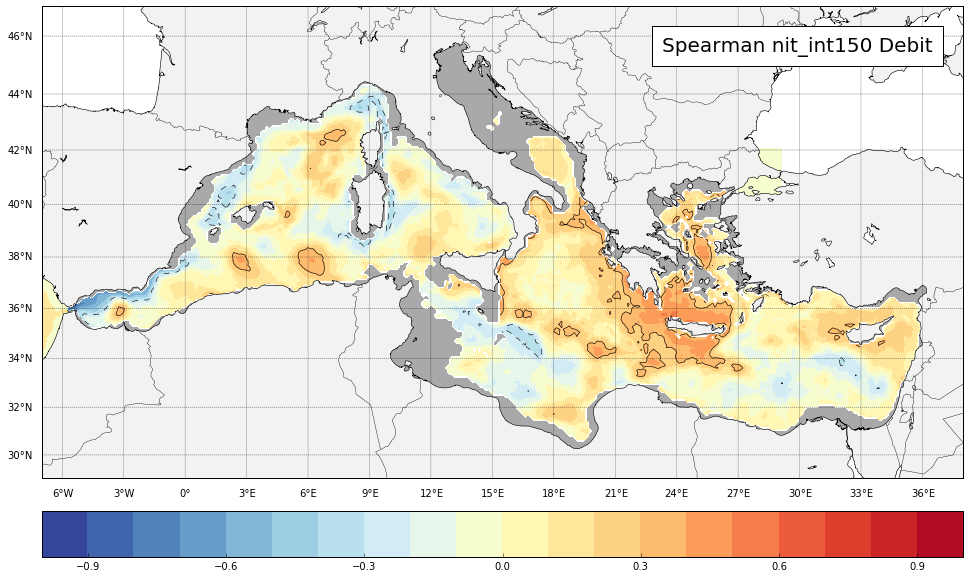

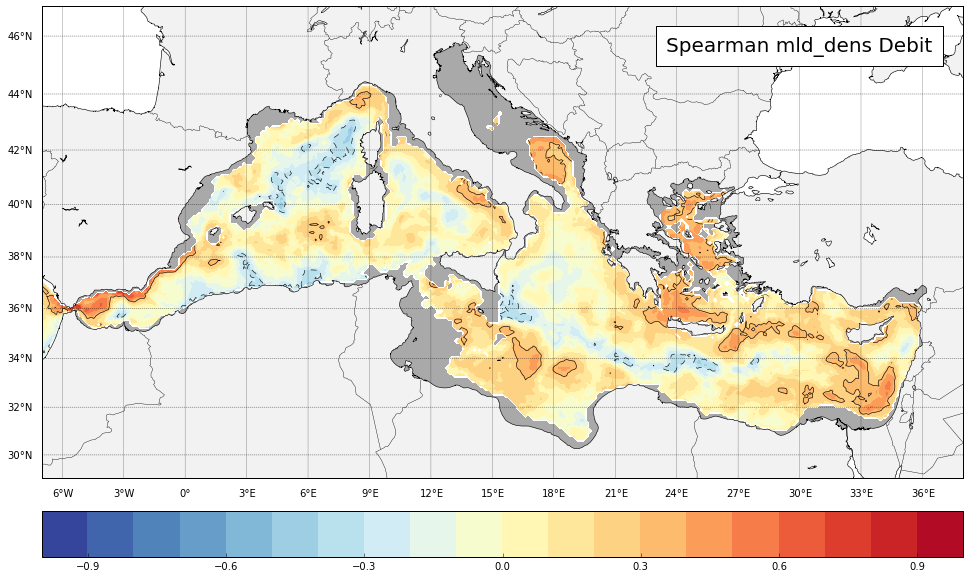

In [20]:
## Listes pour corrélations
#corr_list1 = ['chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
#           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150']
corr_list1 = ['nit_int150', 'mld_dens']
#corr_list2 = ['mld_dens']
corr_list2 = ['Debit']
method_list = ['Spearman']


## Pour figs
for corr1 in corr_list1:
    for corr2 in corr_list2:
        for method in method_list:
            fig = plt.figure(figsize=(16,16));

            x1,x2,y1,y2 = -7, 38, 29, 47;
            m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            ax = fig.add_axes([0.1,0.1,0.8,0.8]);
            m.drawcountries(linewidth=0.4);
            m.drawcoastlines(linewidth=0.6);
            m.fillcontinents(color='0.95',lake_color='white');
            parallels = np.arange(0.,81,2);
            m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
            meridians = np.arange(-6.,351.,3); # 1.5
            m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

            data_to_plot = vars()[method+'_'+corr1+'_'+corr2]
            data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)
            
            # doing a map # Données
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(-1,1.1,0.1);
            levels2 = [-0.304,0.304]; # More precise critical value for df=31 (N=33)
            levels_bathy = [200] ;
            m.contourf(xd,yd,test,cmap=plt.cm.Greys);
            CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
            CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
            plt.colorbar(cs, orientation='horizontal', pad = 0.035)

            x_text,y_text = m(36.5,46)
            this_txt = method+' '+corr1+' '+corr2
            plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') #

            plt.savefig('/home/dosa/THESE/CR_reunions/MAR2019_FIGS/DEBIT_GIB_CORR/'+method+'_'+corr1+'_'+corr2+'.png',bbox_inches='tight',format='png')

In [25]:
# 26/02 ouverture en boucle de tous les fichiers 
file_list = ['Nit', 'Amm', 'PON'] # 'Nit', 'Amm', 'DON', 'PON', 'Pho', 'DOP', 'POP', 'Sil'

for file in file_list:
    vars()['df_'+file] = pd.read_table('./debitnew/debitbio_section_Gibraltar'+file,sep='\s+',names=['time','debit','debpos','debneg','debsw',
                                       'debssw','debiw','debdw'])
    vars()['df_'+file]['date'] = pd.to_datetime(vars()['df_'+file]['time'], format="%Y%m%d")
    vars()['df_'+file]['yy'] = pd.DatetimeIndex(vars()['df_'+file]['date']).year
    vars()['df_'+file]['mm'] = pd.DatetimeIndex(vars()['df_'+file]['date']).month
    
    yy_corr = np.zeros([len(vars()['df_'+file])])
    yy_corr[:] = np.nan
    vars()['df_'+file]['yy_corr'] = yy_corr 
    
    for o in np.arange(0, len(vars()['df_'+file])):
        if vars()['df_'+file]['mm'][o] >= 10:
            vars()['df_'+file]['yy_corr'][o] = vars()['df_'+file]['yy'][o]
        else:
            vars()['df_'+file]['yy_corr'][o] = vars()['df_'+file]['yy'][o]-1

print 'End of cell'

/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


End of cell


In [26]:
year_list = np.arange(1970,2012)
file_list = ['Nit', 'Amm', 'PON', 'DON'] #

for file in file_list:
    print file
    count = 0
    vars()['AnnMean_'+file] = np.zeros([len(year_list)]) # ou len year_list pareil

    for y in year_list:
        vars()['AnnMean_'+file][count] =  vars()['df_'+file].groupby('yy_corr')['debsw'].mean()[y]
        count += 1
        
np.shape(AnnMean_DON)

Nit
Amm
PON
DON


(42,)

In [37]:
# TEST ENTREE GIB
## Listes pour corrélations
#corr_list1 = ['nit_int150', 'mld_dens', 'chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
#           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150', 'graz', 'graz_herbi', 'graz_pur']
corr_list1 = ['nit_int150', 'mld_dens']
corr_list2 = ['Nit', 'Amm', 'PON', 'DON']

## Corrélation Pearson
for corr1 in corr_list1:
    for corr2 in corr_list2:
        print corr1, corr2
        
        vars()['Spearman_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Spearman_'+corr1+'_'+corr2][:] = np.nan
        
        for i in np.arange(0,160):
            for j in np.arange(0,394):
                vect1 = vars()[corr1+'_arr'][:,i,j]
                vect2 = -vars()['AnnMean_'+corr2]
                vars()['Spearman_'+corr1+'_'+corr2][i,j] = scpst.spearmanr(vect1,vect2)[0]
                vect1 = []
                vect2 = []
                
print 'END of CELL'

nit_int150 Nit
nit_int150 Amm
nit_int150 PON
nit_int150 DON
mld_dens Nit
mld_dens Amm
mld_dens PON
mld_dens DON
END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in less


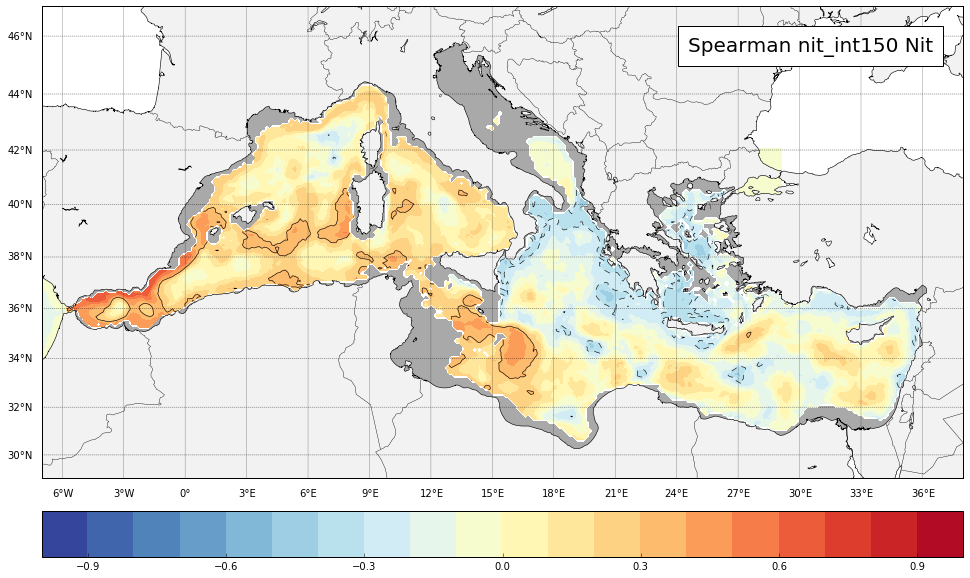

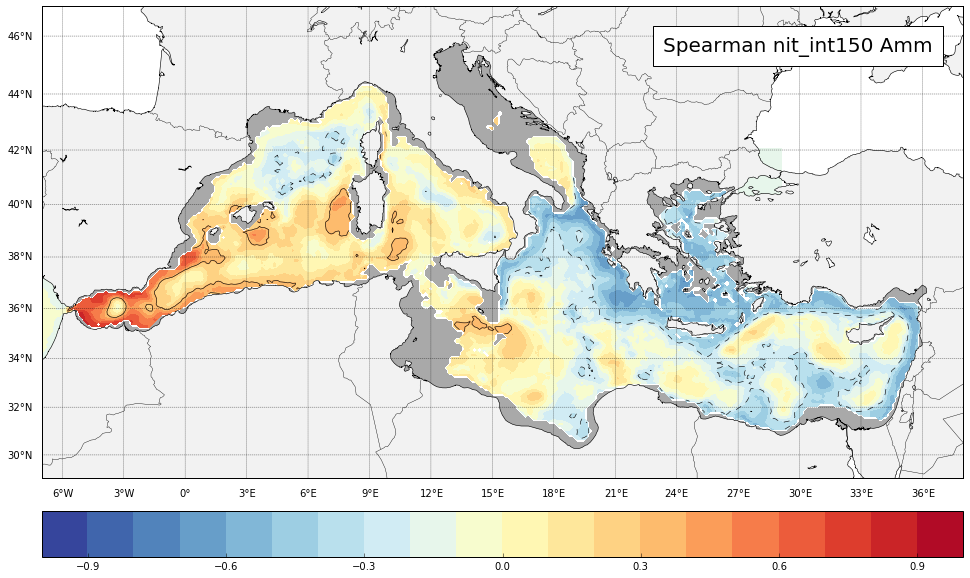

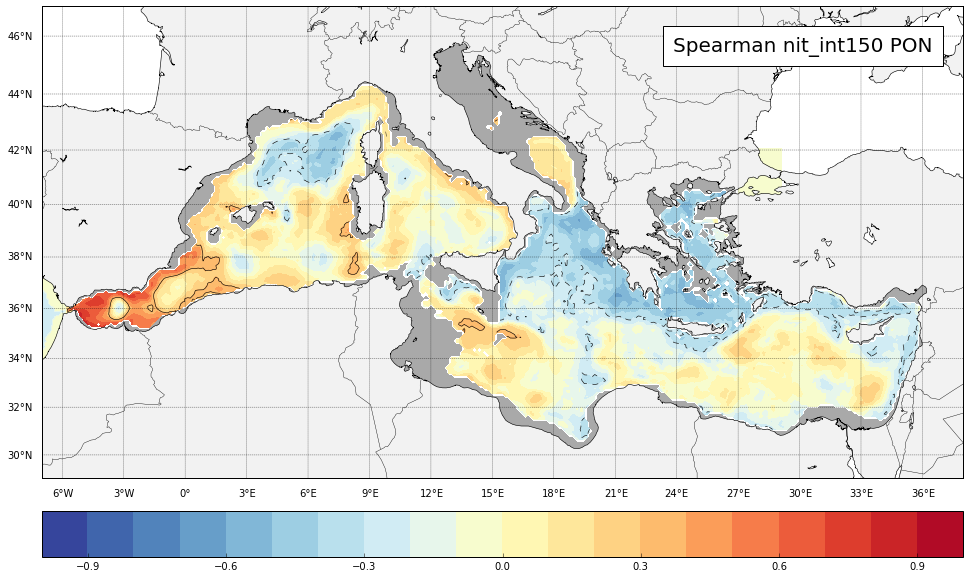

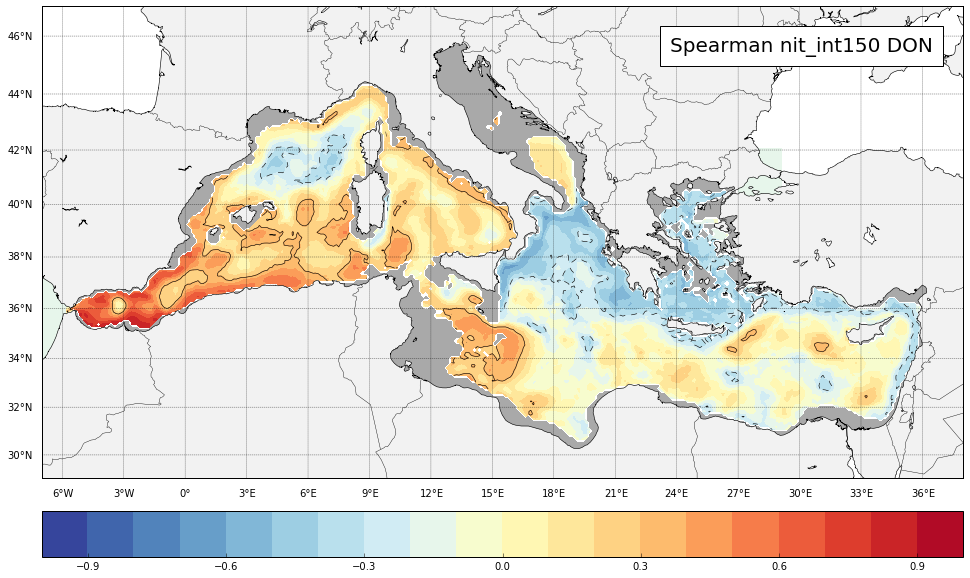

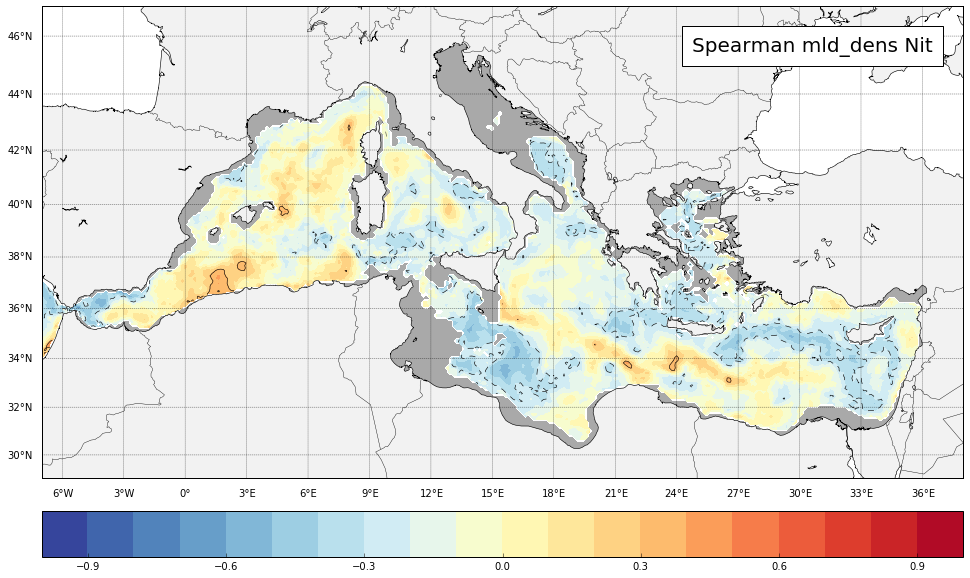

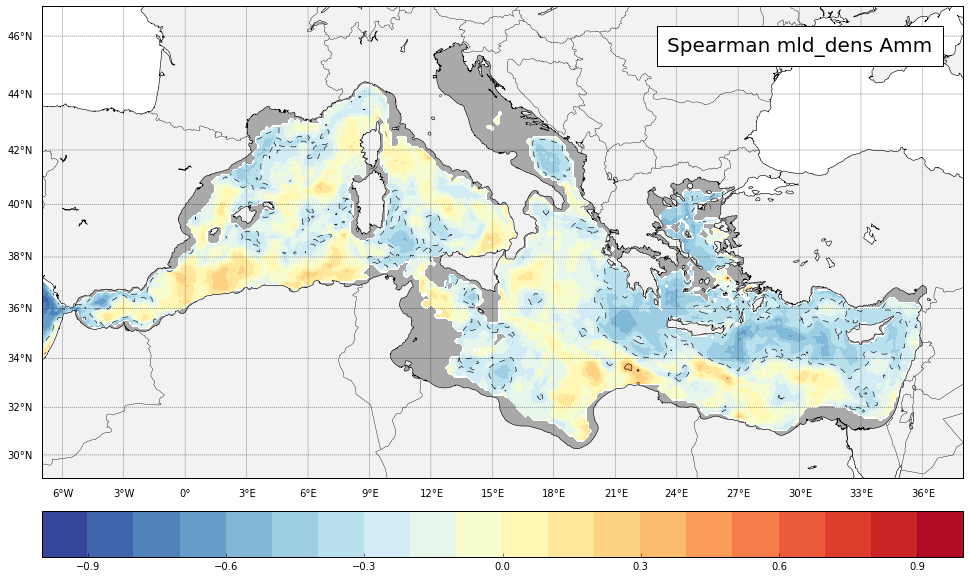

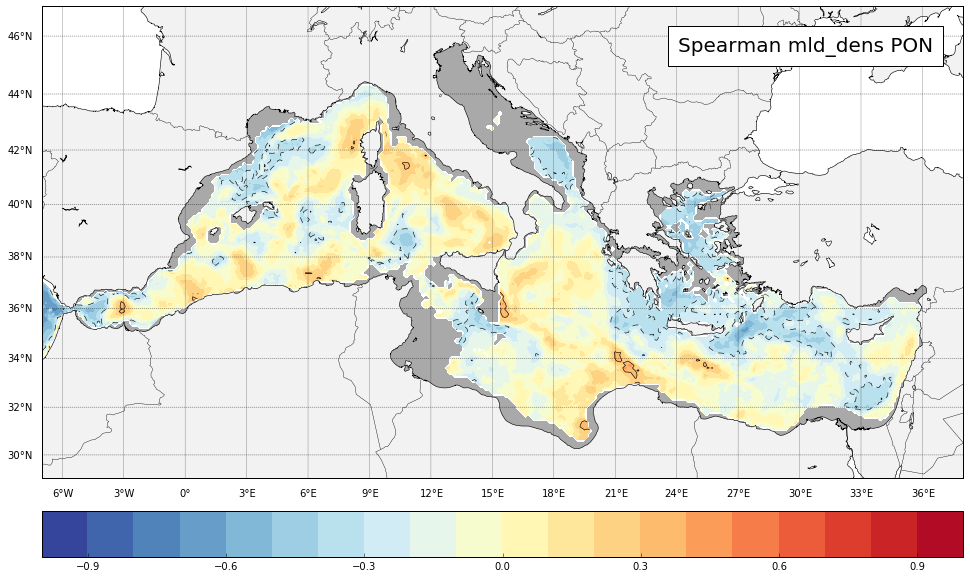

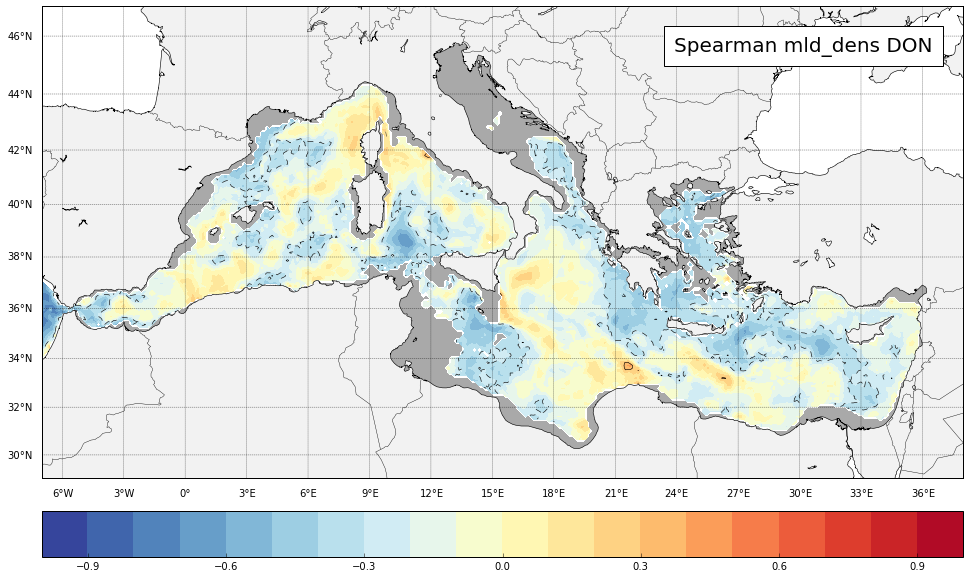

In [38]:
## Listes pour corrélations
#corr_list1 = ['chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
#           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150']
corr_list1 = ['nit_int150', 'mld_dens']
#corr_list2 = ['mld_dens']
corr_list2 = ['Nit', 'Amm', 'PON', 'DON']
method_list = ['Spearman']


## Pour figs
for corr1 in corr_list1:
    for corr2 in corr_list2:
        for method in method_list:
            fig = plt.figure(figsize=(16,16));

            x1,x2,y1,y2 = -7, 38, 29, 47;
            m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            ax = fig.add_axes([0.1,0.1,0.8,0.8]);
            m.drawcountries(linewidth=0.4);
            m.drawcoastlines(linewidth=0.6);
            m.fillcontinents(color='0.95',lake_color='white');
            parallels = np.arange(0.,81,2);
            m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
            meridians = np.arange(-6.,351.,3); # 1.5
            m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

            data_to_plot = vars()[method+'_'+corr1+'_'+corr2]
            data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)
            
            # doing a map # Données
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(-1,1.1,0.1);
            levels2 = [-0.304,0.304]; # More precise critical value for df=31 (N=33)
            levels_bathy = [200] ;
            m.contourf(xd,yd,test,cmap=plt.cm.Greys);
            CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
            CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
            plt.colorbar(cs, orientation='horizontal', pad = 0.035)

            x_text,y_text = m(36.5,46)
            this_txt = method+' '+corr1+' '+corr2
            plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') #

            plt.savefig('/home/dosa/THESE/CR_reunions/MAR2019_FIGS/DEBIT_GIB_CORR/'+method+'_'+corr1+'_'+corr2+'2.png',bbox_inches='tight',format='png')

In [29]:
AnnMean_Inorg = AnnMean_Nit+AnnMean_Amm

In [30]:
AnnMean_Org = AnnMean_DON+AnnMean_PON

In [33]:
# TEST ENTREE GIB
## Listes pour corrélations
#corr_list1 = ['nit_int150', 'mld_dens', 'chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
#           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150', 'graz', 'graz_herbi', 'graz_pur']
corr_list1 = ['nit_int150', 'mld_dens']
corr_list2 = ['Inorg', 'Org']

## Corrélation Pearson
for corr1 in corr_list1:
    for corr2 in corr_list2:
        print corr1, corr2
        
        vars()['Spearman_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Spearman_'+corr1+'_'+corr2][:] = np.nan
        
        for i in np.arange(0,160):
            for j in np.arange(0,394):
                vect1 = vars()[corr1+'_arr'][:,i,j]
                vect2 = -vars()['AnnMean_'+corr2]
                vars()['Spearman_'+corr1+'_'+corr2][i,j] = scpst.spearmanr(vect1,vect2)[0]
                vect1 = []
                vect2 = []
                
print 'END of CELL'

nit_int150 Inorg
nit_int150 Org
mld_dens Inorg
mld_dens Org
END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in less


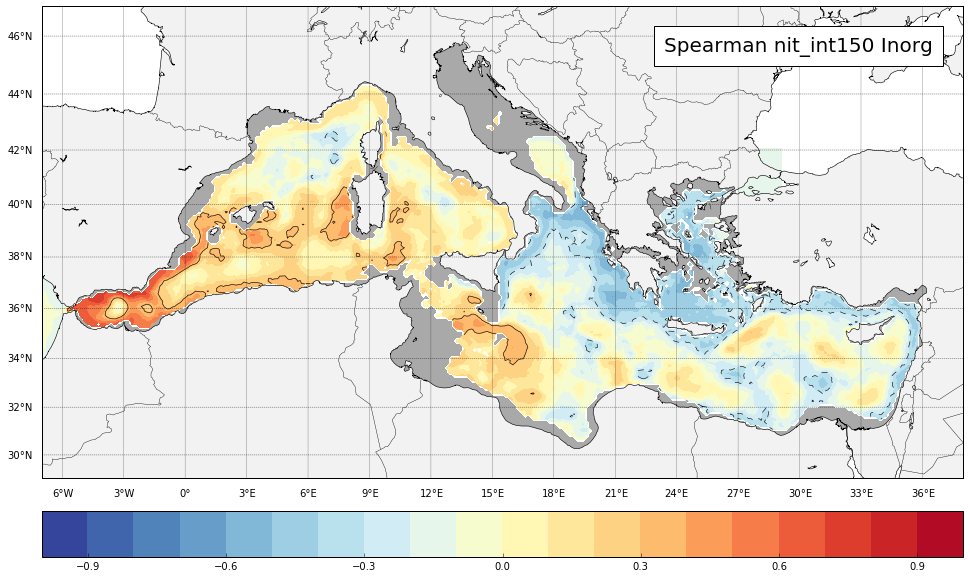

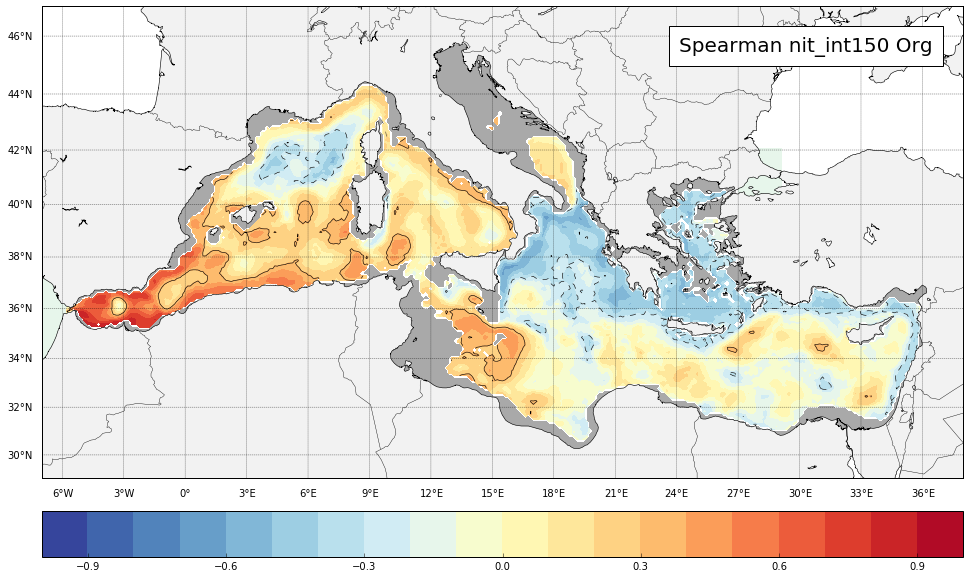

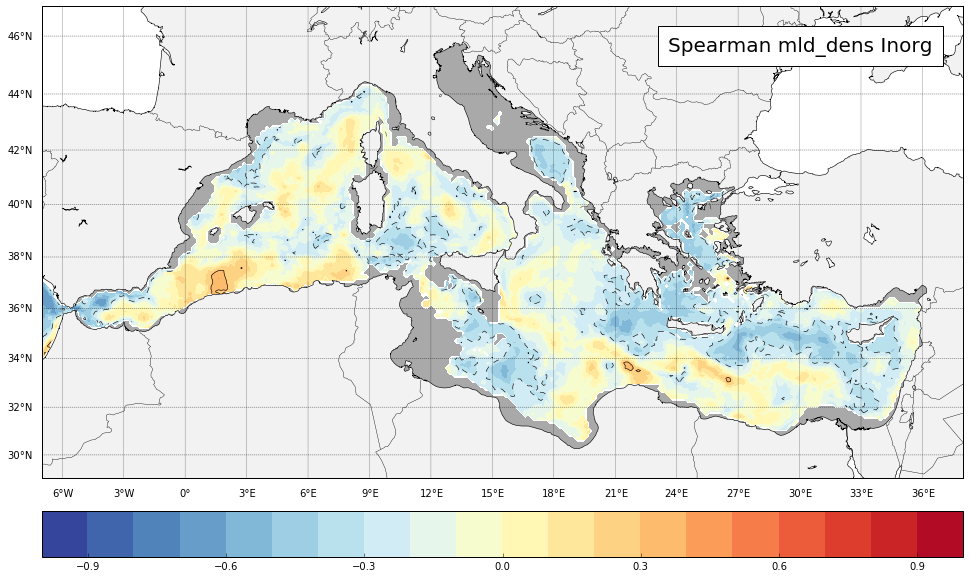

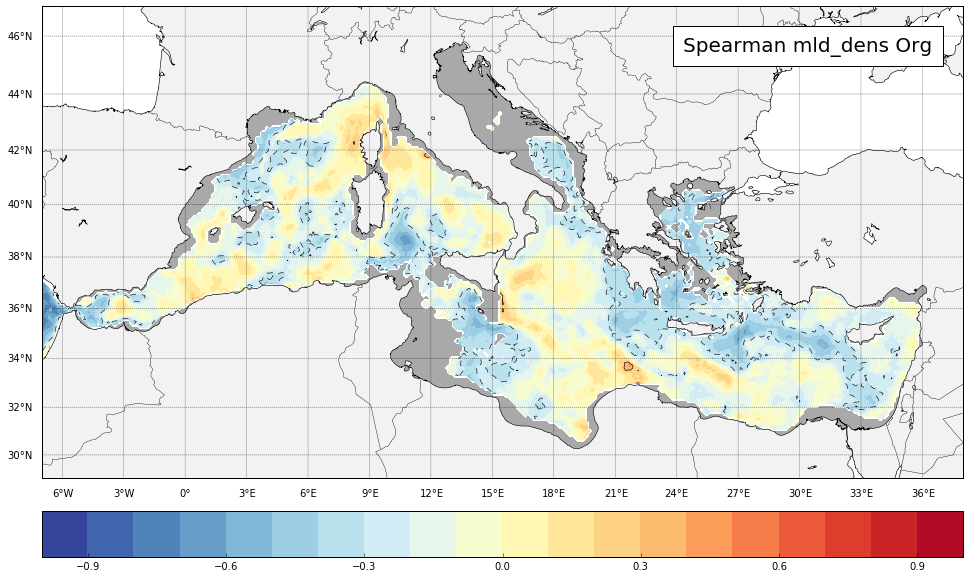

In [34]:
## Listes pour corrélations
#corr_list1 = ['chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
#           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150']
corr_list1 = ['nit_int150', 'mld_dens']
#corr_list2 = ['mld_dens']
corr_list2 = ['Inorg', 'Org']
method_list = ['Spearman']


## Pour figs
for corr1 in corr_list1:
    for corr2 in corr_list2:
        for method in method_list:
            fig = plt.figure(figsize=(16,16));

            x1,x2,y1,y2 = -7, 38, 29, 47;
            m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            ax = fig.add_axes([0.1,0.1,0.8,0.8]);
            m.drawcountries(linewidth=0.4);
            m.drawcoastlines(linewidth=0.6);
            m.fillcontinents(color='0.95',lake_color='white');
            parallels = np.arange(0.,81,2);
            m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
            meridians = np.arange(-6.,351.,3); # 1.5
            m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

            data_to_plot = vars()[method+'_'+corr1+'_'+corr2]
            data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)
            
            # doing a map # Données
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(-1,1.1,0.1);
            levels2 = [-0.304,0.304]; # More precise critical value for df=31 (N=33)
            levels_bathy = [200] ;
            m.contourf(xd,yd,test,cmap=plt.cm.Greys);
            CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
            CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
            plt.colorbar(cs, orientation='horizontal', pad = 0.035)

            x_text,y_text = m(36.5,46)
            this_txt = method+' '+corr1+' '+corr2
            plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') #

            plt.savefig('/home/dosa/THESE/CR_reunions/MAR2019_FIGS/DEBIT_GIB_CORR/'+method+'_'+corr1+'_'+corr2+'.png',bbox_inches='tight',format='png')

In [35]:
AnnMean_Ntot = AnnMean_Inorg + AnnMean_Org

# TEST ENTREE GIB
## Listes pour corrélations
#corr_list1 = ['nit_int150', 'mld_dens', 'chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
#           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150', 'graz', 'graz_herbi', 'graz_pur']
corr_list1 = ['nit_int150', 'mld_dens']
corr_list2 = ['Ntot']

## Corrélation Pearson
for corr1 in corr_list1:
    for corr2 in corr_list2:
        print corr1, corr2
        
        vars()['Spearman_'+corr1+'_'+corr2] = np.zeros([160,394])
        vars()['Spearman_'+corr1+'_'+corr2][:] = np.nan
        
        for i in np.arange(0,160):
            for j in np.arange(0,394):
                vect1 = vars()[corr1+'_arr'][:,i,j]
                vect2 = -vars()['AnnMean_'+corr2]
                vars()['Spearman_'+corr1+'_'+corr2][i,j] = scpst.spearmanr(vect1,vect2)[0]
                vect1 = []
                vect2 = []
                
print 'END of CELL'

nit_int150 Ntot
mld_dens Ntot
END of CELL


/home/dosa/MON_ENV_PYTHON/lib/python2.7/site-packages/ipykernel/__main__.py:28: RuntimeWarning: invalid value encountered in less


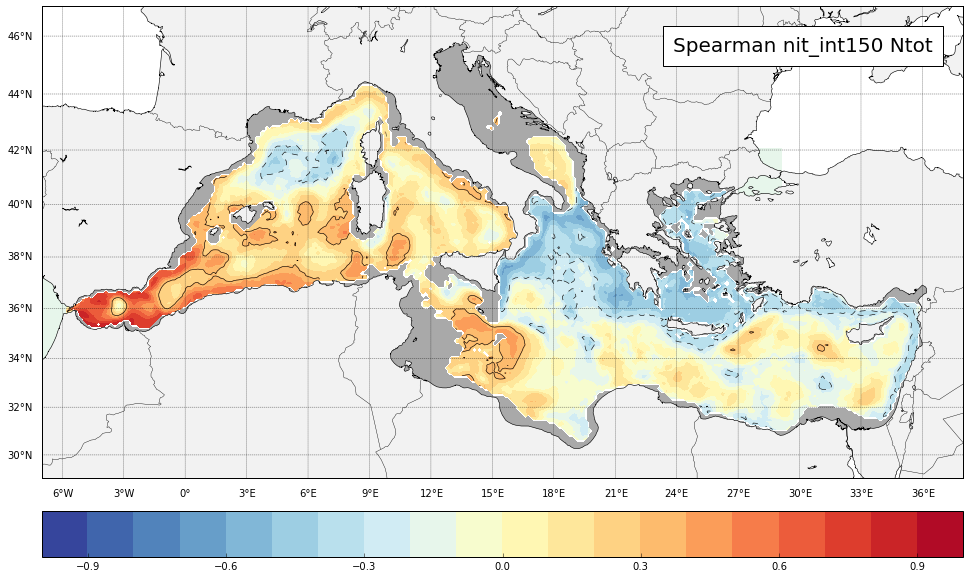

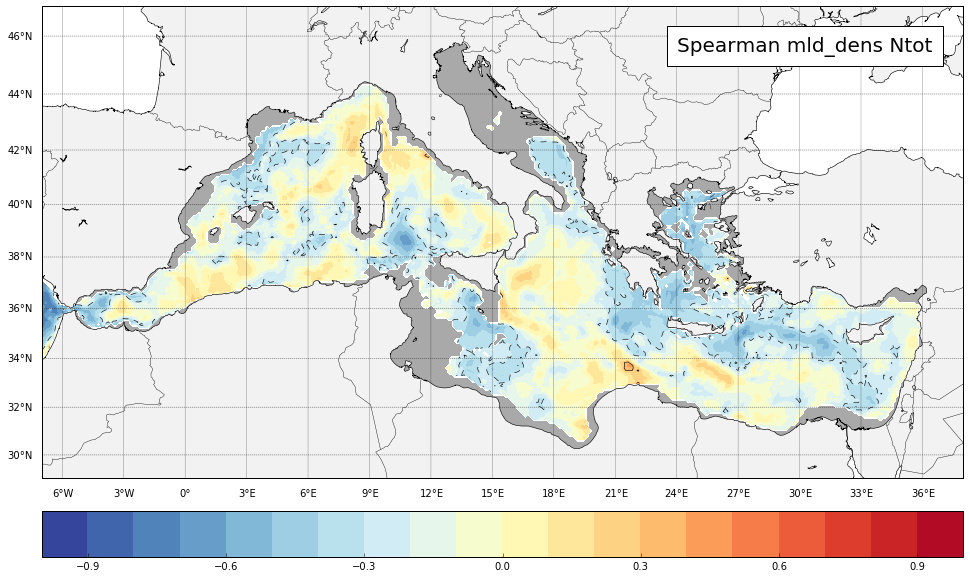

In [36]:
## Listes pour corrélations
#corr_list1 = ['chl_int150', 'UptNitsurf', 'UptNitint', 'UptAmmoSurf', 'UptAmmoint',
#           'chlsurf', 'export_poc200', 'export_doc200', 'ppb', 'netppb', 'chl_int150']
corr_list1 = ['nit_int150', 'mld_dens']
#corr_list2 = ['mld_dens']
corr_list2 = ['Ntot']
method_list = ['Spearman']


## Pour figs
for corr1 in corr_list1:
    for corr2 in corr_list2:
        for method in method_list:
            fig = plt.figure(figsize=(16,16));

            x1,x2,y1,y2 = -7, 38, 29, 47;
            m = Basemap(resolution='i',projection='merc', llcrnrlat=y1,urcrnrlat=y2,llcrnrlon=x1,urcrnrlon=x2,lat_ts=(x1+x2)/2);
            ax = fig.add_axes([0.1,0.1,0.8,0.8]);
            m.drawcountries(linewidth=0.4);
            m.drawcoastlines(linewidth=0.6);
            m.fillcontinents(color='0.95',lake_color='white');
            parallels = np.arange(0.,81,2);
            m.drawparallels(parallels,labels=[True,False,True,False],linewidth=0.4);
            meridians = np.arange(-6.,351.,3); # 1.5
            m.drawmeridians(meridians,labels=[True,False,False,True],linewidth=0.4);

            data_to_plot = vars()[method+'_'+corr1+'_'+corr2]
            data_to_plot = np.ma.masked_where(bathy<200,data_to_plot)
            
            # doing a map # Données
            xd,yd = m(lon_t,lat_t);
            levels = np.arange(-1,1.1,0.1);
            levels2 = [-0.304,0.304]; # More precise critical value for df=31 (N=33)
            levels_bathy = [200] ;
            m.contourf(xd,yd,test,cmap=plt.cm.Greys);
            CS_bathy = m.contour(xd,yd,bathy,levels=levels_bathy,linewidths=2.5,colors='grey');
            cs = m.contourf(xd,yd,data_to_plot,levels=levels,cmap=plt.cm.RdYlBu_r);#levels=levels, cmap=plt.cm.RdYlBu_r
            CS1 = m.contour(xd,yd,data_to_plot,levels=levels2,linewidths=0.6,colors='k');
            plt.colorbar(cs, orientation='horizontal', pad = 0.035)

            x_text,y_text = m(36.5,46)
            this_txt = method+' '+corr1+' '+corr2
            plt.text(x_text,y_text, this_txt,fontsize=20,  bbox={'facecolor':'white', 'pad':10},ha='right', va ='top') #

            plt.savefig('/home/dosa/THESE/CR_reunions/MAR2019_FIGS/DEBIT_GIB_CORR/'+method+'_'+corr1+'_'+corr2+'.png',bbox_inches='tight',format='png')